In [ ]:
from google.colab import drive
drive.mount("/content/drive")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression , ElasticNet , Lasso , Ridge
from sklearn.metrics import r2_score
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from lightgbm import LGBMRegressor
from sklearn.kernel_ridge import KernelRidge
plt.style.use('fivethirtyeight')
colors=['#ffcd94','#eac086','#ffad60','#ffe39f']
sns.set_palette(sns.color_palette(colors))

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/CapstoneProjects/bodyfat.csv')

In [ ]:
df.head()

,AgeGroup,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,YoungAge,1.0708,12.3,23,154.25,67.75,36.2,93.1,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1
1,YoungAge,1.0853,6.1,22,173.25,72.25,38.5,93.6,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2
2,YoungAge,1.0414,25.3,22,154.00,66.25,34.0,95.8,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6
3,YoungAge,1.0751,10.4,26,184.75,72.25,37.4,101.8,86.4,101.2,60.1,37.3,22.8,32.4,29.4,18.2
4,YoungAge,1.0340,28.7,24,184.25,71.25,34.4,97.3,100.0,101.9,63.2,42.2,24.0,32.2,27.7,17.7


In [ ]:
df.tail()

,AgeGroup,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
247,OldAge,1.0736,11.0,70,134.25,67.00,34.9,89.2,83.6,88.8,49.6,34.8,21.5,25.6,25.7,18.5
248,OldAge,1.0236,33.6,72,201.00,69.75,40.9,108.5,105.0,104.5,59.6,40.8,23.2,35.2,28.6,20.1
249,OldAge,1.0328,29.3,72,186.75,66.00,38.9,111.1,111.5,101.7,60.3,37.3,21.5,31.3,27.2,18.0
250,OldAge,1.0399,26.0,72,190.75,70.50,38.9,108.3,101.3,97.8,56.0,41.6,22.7,30.5,29.4,19.8
251,OldAge,1.0271,31.9,74,207.50,70.00,40.8,112.4,108.5,107.1,59.3,42.2,24.6,33.7,30.0,20.9


In [ ]:
df.shape

(252, 16)

In [ ]:
df.columns

Index(['AgeGroup', 'Density', 'BodyFat', 'Age', 'Weight', 'Height', 'Neck',
       'Chest', 'Abdomen', 'Hip', 'Thigh', 'Knee', 'Ankle', 'Biceps',
       'Forearm', 'Wrist'],
      dtype='object')

In [ ]:
df.nunique()

AgeGroup      4
Density     218
BodyFat     176
Age          51
Weight      197
Height       48
Neck         90
Chest       174
Abdomen     185
Hip         152
Thigh       139
Knee         90
Ankle        61
Biceps      104
Forearm      77
Wrist        44
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252 entries, 0 to 251
Data columns (total 16 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   AgeGroup  252 non-null    object 
 1   Density   252 non-null    float64
 2   BodyFat   252 non-null    float64
 3   Age       252 non-null    int64  
 4   Weight    252 non-null    float64
 5   Height    252 non-null    float64
 6   Neck      252 non-null    float64
 7   Chest     252 non-null    float64
 8   Abdomen   252 non-null    float64
 9   Hip       252 non-null    float64
 10  Thigh     252 non-null    float64
 11  Knee      252 non-null    float64
 12  Ankle     252 non-null    float64
 13  Biceps    252 non-null    float64
 14  Forearm   252 non-null    float64
 15  Wrist     252 non-null    float64
dtypes: float64(14), int64(1), object(1)
memory usage: 31.6+ KB


In [ ]:
df.describe()

,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
count,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000,252.000000
mean,1.055574,19.150794,44.884921,178.924405,70.148810,37.992063,100.824206,92.555952,99.904762,59.405952,38.590476,23.102381,32.273413,28.663889,18.229762
std,0.019031,8.368740,12.602040,29.389160,3.662856,2.430913,8.430476,10.783077,7.164058,5.249952,2.411805,1.694893,3.021274,2.020691,0.933585
min,0.995000,0.000000,22.000000,118.500000,29.500000,31.100000,79.300000,69.400000,85.000000,47.200000,33.000000,19.100000,24.800000,21.000000,15.800000
25%,1.041400,12.475000,35.750000,159.000000,68.250000,36.400000,94.350000,84.575000,95.500000,56.000000,36.975000,22.000000,30.200000,27.300000,17.600000
50%,1.054900,19.200000,43.000000,176.500000,70.000000,38.000000,99.650000,90.950000,99.300000,59.000000,38.500000,22.800000,32.050000,28.700000,18.300000
75%,1.070400,25.300000,54.000000,197.000000,72.250000,39.425000,105.375000,99.325000,103.525000,62.350000,39.925000,24.000000,34.325000,30.000000,18.800000
max,1.108900,47.500000,81.000000,363.150000,77.750000,51.200000,136.200000,148.100000,147.700000,87.300000,49.100000,33.900000,45.000000,34.900000,21.400000


In [ ]:
df.isnull() .sum()

AgeGroup    0
Density     0
BodyFat     0
Age         0
Weight      0
Height      0
Neck        0
Chest       0
Abdomen     0
Hip         0
Thigh       0
Knee        0
Ankle       0
Biceps      0
Forearm     0
Wrist       0
dtype: int64

In [ ]:
df.duplicated().sum()

0

<ipython-input-14-ef1c8e0a3401>:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  df.hist(ax=ax,bins =30)


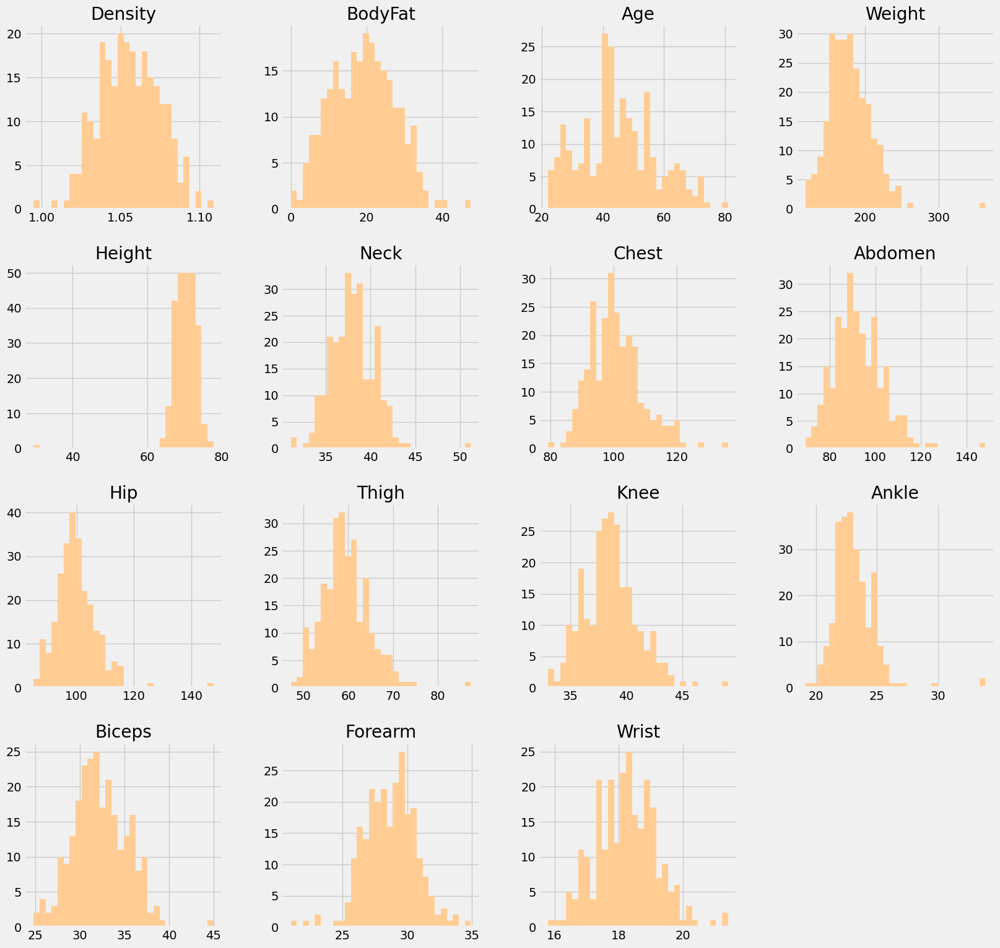

In [ ]:
#3. Visualising data  distribution in detail
fig = plt.figure(figsize =(18,18))
ax=fig.gca()
df.hist(ax=ax,bins =30)
plt.show()

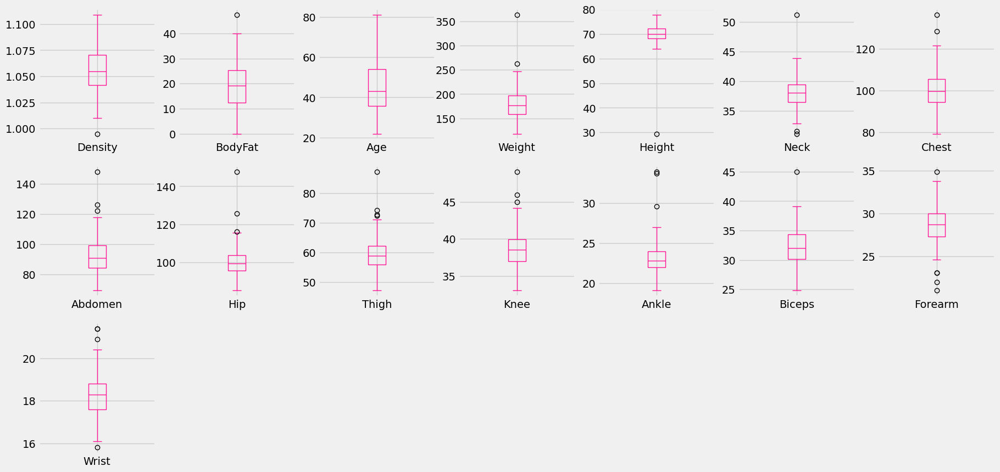

In [ ]:
#detecting outliers
df.plot(kind='box', subplots=True, layout=(3,7),sharex=False,sharey=False, figsize=(20, 10), color='deeppink');

In [ ]:
# Identify the outliers
# define continuous variable & plot
continous_features = ['Density','BodyFat','Age','Weight', 'Chest']
def outliers(df_out, drop = False):
    for each_feature in df_out.columns:
        feature_data = df_out[each_feature]
        Q1 = np.percentile(feature_data, 25.) # 25th percentile of the data of the given feature
        Q3 = np.percentile(feature_data, 75.) # 75th percentile of the data of the given feature
        IQR = Q3-Q1 #Interquartile Range
        outlier_step = IQR * 1.5 #That's we were talking about above
        outliers = feature_data[~((feature_data >= Q1 - outlier_step) & (feature_data <= Q3 + outlier_step))].index.tolist()  
        if not drop:
            print('For the feature {}, No of Outliers is {}'.format(each_feature, len(outliers)))
        if drop:
            df.drop(outliers, inplace = True, errors = 'ignore')
            print('Outliers from {} feature removed'.format(each_feature))
outliers(df[continous_features])


For the feature Density, No of Outliers is 1
For the feature BodyFat, No of Outliers is 1
For the feature Age, No of Outliers is 0
For the feature Weight, No of Outliers is 2
For the feature Chest, No of Outliers is 2


In [ ]:
#drop the outliers
outliers(df[continous_features], drop = True)

Outliers from Density feature removed
Outliers from BodyFat feature removed
Outliers from Age feature removed
Outliers from Weight feature removed
Outliers from Chest feature removed


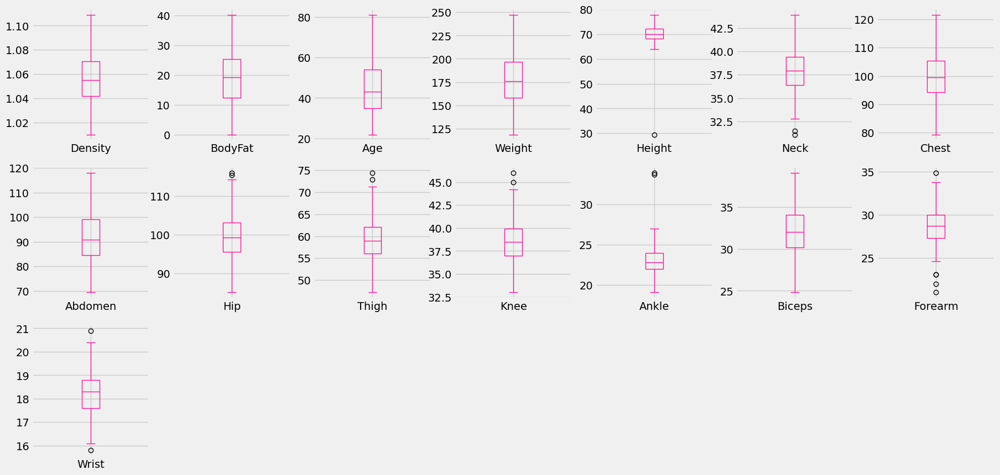

In [ ]:
#check if outliers got removed
df.plot(kind='box', subplots=True, layout=(3,7),sharex=False,sharey=False, figsize=(20, 10), color='deeppink');

In [ ]:
outliers(df[continous_features], drop = True)


Outliers from Density feature removed
Outliers from BodyFat feature removed
Outliers from Age feature removed
Outliers from Weight feature removed
Outliers from Chest feature removed


In [ ]:
df.shape

(249, 16)

MiddleAge    99
SeniorAge    77
YoungAge     38
OldAge       35
Name: AgeGroup, dtype: int64


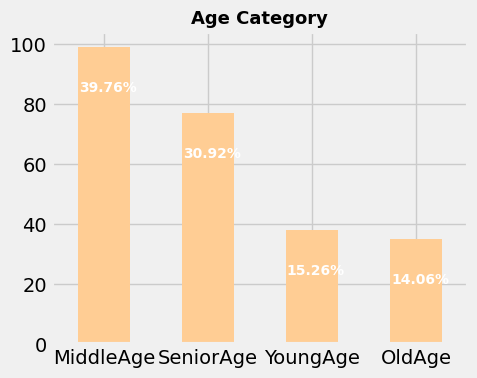

In [ ]:
#checking target value distribution
#This checking is irrelevant for Body Fat Prediction because the dataset has no result
print(df.AgeGroup.value_counts())

fig, ax = plt.subplots(figsize=(5,4))
name = ["MiddleAge", "SeniorAge", "YoungAge", "OldAge"]
ax = df.AgeGroup.value_counts().plot(kind='bar')
ax.set_title("Age Category", fontsize = 13, weight = 'bold')
ax.set_xticklabels (name, rotation = 0)
# To calculate the percentage
totals = []
for i in ax.patches:
    totals.append(i.get_height())
total = sum(totals)
for i in ax.patches:
    ax.text(i.get_x()+.01, i.get_height()-15, \
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=10,
                color='white', weight = 'bold')
    
plt.tight_layout()

<ipython-input-22-ab322c625e56>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot = True, linewidths=.5, cmap="Blues")


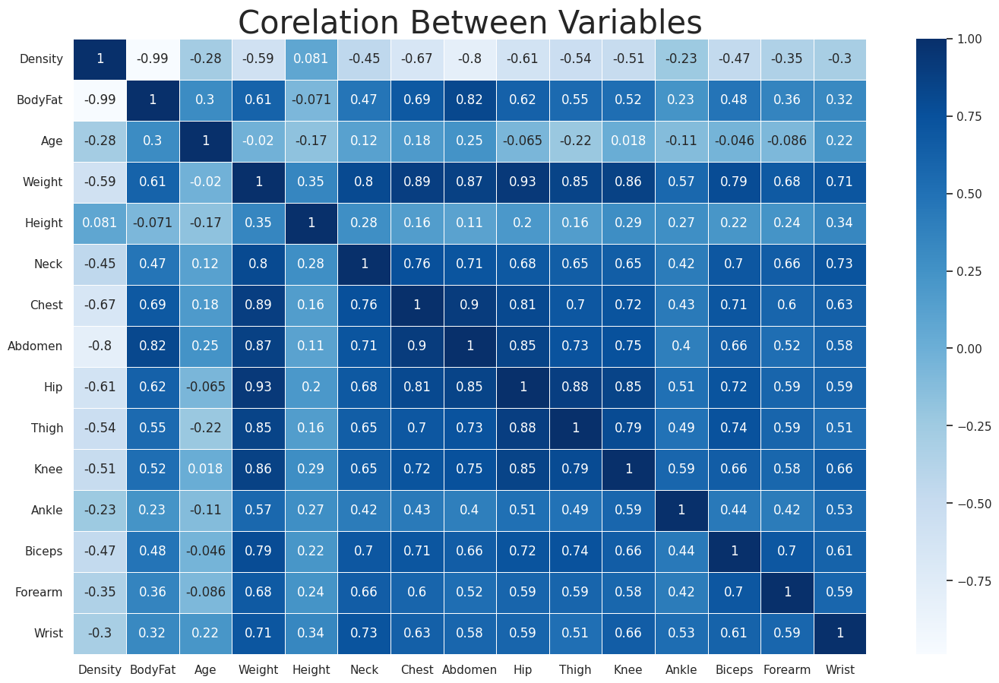

In [ ]:
#check correlation between variables
sns.set(style="white") 
plt.rcParams['figure.figsize'] = (15, 10) 
sns.heatmap(df.corr(), annot = True, linewidths=.5, cmap="Blues")
plt.title('Corelation Between Variables', fontsize = 30)
plt.show()

In [ ]:
#Install  Pandas profiling report
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.6/22.6 MB 23.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 81.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 12.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 43.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 55.7 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=345992 sha256=7dd5a472a5bd315d21833e4347c73c2dae8fdb50518a9c6c936791a5b2821fd

In [ ]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
profile = ProfileReport(df,title="Body Fat Prediction",
                        html={'style':{'full_width':True}})
profile.to_notebook_iframe()


<ipython-input-24-b99648625c27>:3: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#pre-processing
from sklearn.exceptions import DataDimensionalityWarning
#encode object columns to integers
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder

for col in df:
  if df[col].dtype =='object':
    df[col]=OrdinalEncoder().fit_transform(df[col].values.reshape(-1,1))
df

,AgeGroup,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,3.0,1.0708,12.3,23,154.25,67.75,36.2,93.1,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1
1,3.0,1.0853,6.1,22,173.25,72.25,38.5,93.6,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2
2,3.0,1.0414,25.3,22,154.00,66.25,34.0,95.8,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6
3,3.0,1.0751,10.4,26,184.75,72.25,37.4,101.8,86.4,101.2,60.1,37.3,22.8,32.4,29.4,18.2
4,3.0,1.0340,28.7,24,184.25,71.25,34.4,97.3,100.0,101.9,63.2,42.2,24.0,32.2,27.7,17.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,1.0,1.0736,11.0,70,134.25,67.00,34.9,89.2,83.6,88.8,49.6,34.8,21.5,25.6,25.7,18.5
248,1.0,1.0236,33.6,72,201.00,69.75,40.9,108.5,105.0,104.5,59.6,40.8,23.2,35.2,28.6,20.1
249,1.0,1.0328,29.3,72,186.75,66.00,38.9,111.1,111.5,101.7,60.3,37.3,21.5,31.3,27.2,18.0
250,1.0,1.0399,26.0,72,190.75,70.50,38.9,108.3,101.3,97.8,56.0,41.6,22.7,30.5,29.4,19.8


In [ ]:
class_label =df['AgeGroup']
df = df.drop(['AgeGroup'], axis =1)
df = (df-df.min())/(df.max()-df.min())
df['AgeGroup']=class_label
df

,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist,AgeGroup
0,0.614372,0.306733,0.016949,0.277670,0.792746,0.398438,0.326241,0.325103,0.305466,0.433824,0.330769,0.189189,0.503497,0.460432,0.254902,3.0
1,0.761134,0.152120,0.000000,0.425243,0.886010,0.578125,0.338061,0.279835,0.440514,0.422794,0.330769,0.290541,0.398601,0.568345,0.470588,3.0
2,0.316802,0.630923,0.000000,0.275728,0.761658,0.226562,0.390071,0.380658,0.456592,0.455882,0.453846,0.331081,0.279720,0.302158,0.156863,3.0
3,0.657895,0.259352,0.067797,0.514563,0.886010,0.492187,0.531915,0.349794,0.520900,0.474265,0.330769,0.250000,0.531469,0.604317,0.470588,3.0
4,0.241903,0.715711,0.033898,0.510680,0.865285,0.257812,0.425532,0.629630,0.543408,0.588235,0.707692,0.331081,0.517483,0.482014,0.372549,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,0.642713,0.274314,0.813559,0.122330,0.777202,0.296875,0.234043,0.292181,0.122186,0.088235,0.138462,0.162162,0.055944,0.338129,0.529412,1.0
248,0.136640,0.837905,0.847458,0.640777,0.834197,0.765625,0.690307,0.732510,0.627010,0.455882,0.600000,0.277027,0.727273,0.546763,0.843137,1.0
249,0.229757,0.730673,0.847458,0.530097,0.756477,0.609375,0.751773,0.866255,0.536977,0.481618,0.330769,0.162162,0.454545,0.446043,0.431373,1.0
250,0.301619,0.648379,0.847458,0.561165,0.849741,0.609375,0.685579,0.656379,0.411576,0.323529,0.661538,0.243243,0.398601,0.604317,0.784314,1.0


In [ ]:
le = preprocessing.LabelEncoder()
agegroup = le.fit_transform(list(df["AgeGroup"]))
density = le.fit_transform(list(df["Density"]))
bodyfat = le.fit_transform(list(df["BodyFat"]))
age = le.fit_transform(list(df["Age"]))
weight = le.fit_transform(list(df["Weight"]))
height = le.fit_transform(list(df["Height"]))
neck = le.fit_transform(list(df["Neck"]))
chest = le.fit_transform(list(df["Chest"]))
abdomen = le.fit_transform(list(df["Abdomen"]))
hip = le.fit_transform(list(df["Hip"]))
thigh = le.fit_transform(list(df["Thigh"]))
knee = le.fit_transform(list(df["Knee"]))
ankle = le.fit_transform(list(df["Ankle"]))
biceps = le.fit_transform(list(df["Biceps"]))
forearm = le.fit_transform(list(df["Forearm"]))
wrist = le.fit_transform(list(df["Wrist"]))

In [ ]:
x = list(zip(bodyfat,age))
y = list(agegroup)
# Test options and evaluation metric
num_folds = 5
seed = 7
scoring = 'accuracy'

In [ ]:
# Model Test/Train
# Splitting what we are trying to predict into 4 different arrays -
# X train is a section of the x array(attributes) and vise versa for Y(features)
# The test data will test the accuracy of the model created
import sklearn.model_selection
x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x, y, test_size = 0.20, random_state=seed)
#splitting 20% of our data into test samples. If we train the model with higher data it already has seen that information and knows

In [ ]:
#size of train and test subsets after splitting
np.shape(x_train), np.shape(x_test)

((199, 2), (50, 2))

In [ ]:
# Predictive analytics model development by comparing different Scikit-learn classification algorithms
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier

models = []
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('GBM', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
# evaluate each model in turn
results = []
names = []
print("Performance on Training set")
for name, model in models:
  kfold = KFold(n_splits=num_folds,shuffle=True,random_state=seed)
  cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring='accuracy')
  results.append(cv_results)
  names.append(name)
  msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
  msg += '\n'
  print(msg)

Performance on Training set
NB: 0.969872 (0.009939)

SVM: 0.683333 (0.051908)

GBM: 1.000000 (0.000000)

RF: 0.985000 (0.012247)



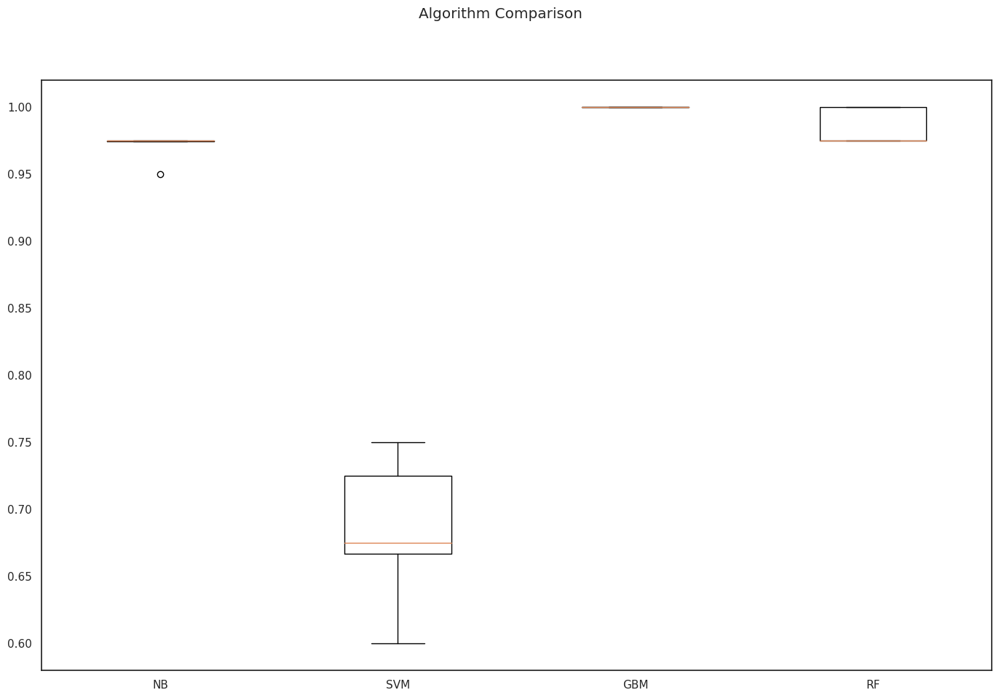

In [ ]:
# Compare Algorithms' Performance
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()


In [ ]:
#Model Evaluation by testing with independent/external test data set. 
#Make predictions on validation/test dataset

#Model Evaluation by testing with independent/external test data set. 
#Make predictions on validation/test dataset

models.append(('DT', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('GBM', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
dt = DecisionTreeClassifier()
nb = GaussianNB()
gb = GradientBoostingClassifier()
rf = RandomForestClassifier()

best_model = gb
best_model.fit(x_train, y_train)
y_pred = best_model.predict(x_test)
print("Best Model Accuracy Score on Test Set:", accuracy_score(y_test, y_pred))

Best Model Accuracy Score on Test Set: 1.0


In [ ]:
#Model Performance Evaluation Metric 1 - Classification Report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00         7
           2       1.00      1.00      1.00        20
           3       1.00      1.00      1.00         9

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50



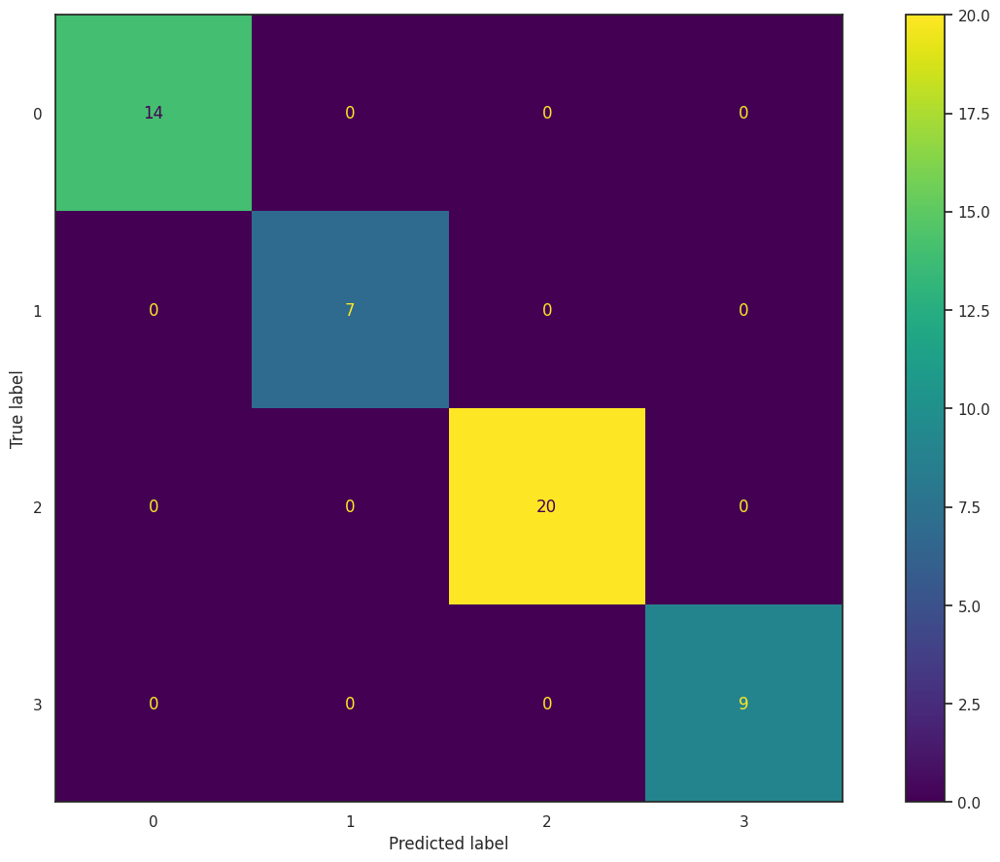

In [ ]:
#Model Performance Evaluation Metric 2
#Confusion matrix 
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

Predicted:  3 Actual:  3 Data:  (26, 4)
Predicted:  2 Actual:  2 Data:  (40, 32)
Predicted:  0 Actual:  0 Data:  (27, 16)
Predicted:  1 Actual:  1 Data:  (62, 48)
Predicted:  3 Actual:  3 Data:  (33, 4)
Predicted:  2 Actual:  2 Data:  (69, 25)
Predicted:  2 Actual:  2 Data:  (110, 25)
Predicted:  1 Actual:  1 Data:  (152, 42)
Predicted:  0 Actual:  0 Data:  (128, 18)
Predicted:  2 Actual:  2 Data:  (54, 28)
Predicted:  2 Actual:  2 Data:  (93, 28)
Predicted:  3 Actual:  3 Data:  (76, 6)
Predicted:  0 Actual:  0 Data:  (84, 18)
Predicted:  2 Actual:  2 Data:  (21, 24)
Predicted:  1 Actual:  1 Data:  (85, 41)
Predicted:  0 Actual:  0 Data:  (4, 20)
Predicted:  0 Actual:  0 Data:  (67, 9)
Predicted:  0 Actual:  0 Data:  (168, 13)
Predicted:  2 Actual:  2 Data:  (111, 27)
Predicted:  2 Actual:  2 Data:  (66, 36)
Predicted:  0 Actual:  0 Data:  (97, 13)
Predicted:  2 Actual:  2 Data:  (63, 31)
Predicted:  0 Actual:  0 Data:  (140, 22)
Predicted:  2 Actual:  2 Data:  (24, 35)
Predicted:  2 A

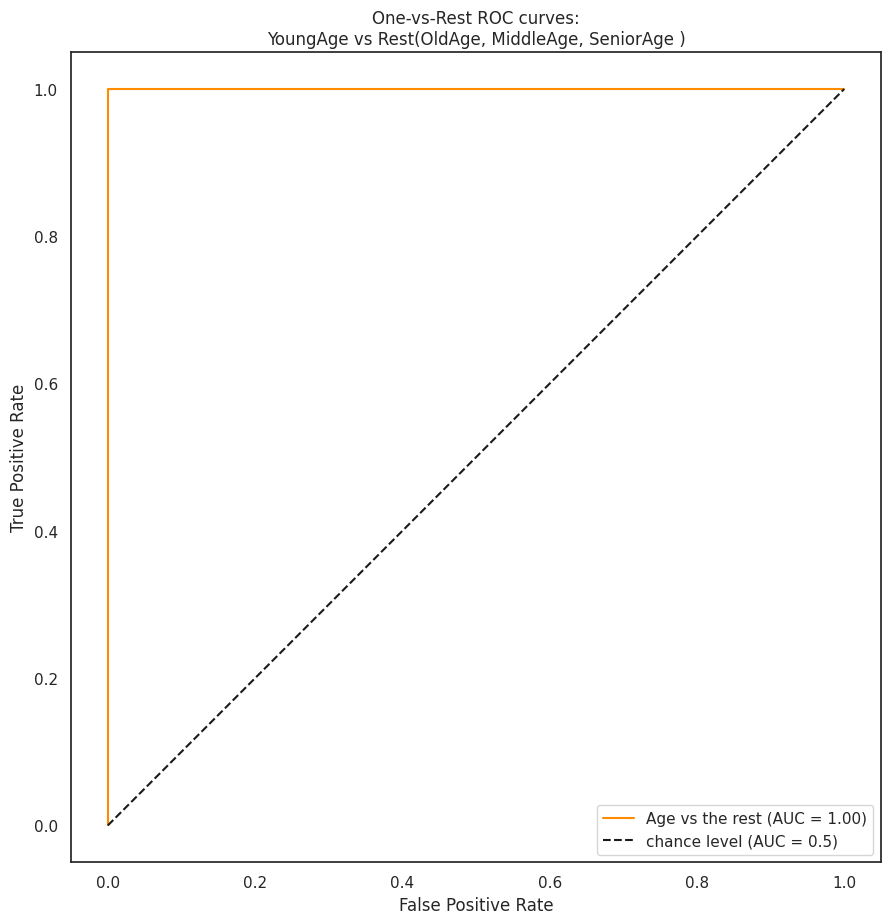

In [ ]:
#Model Evaluation Metric 3- ROC-AUC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.preprocessing import LabelBinarizer

#Check actual/ground truth vs predicted diagnosis
for x in range(len(y_pred)):
    print("Predicted: ", y_pred[x], "Actual: ", y_test[x], "Data: ", x_test[x],)

label_binarizer = LabelBinarizer().fit(y_train)
y_onehot_test = label_binarizer.transform(y_test)
y_onehot_test.shape  # (n_samples, n_classes)

#ROC curve for class 3 ('YoungAge')
from sklearn.metrics import RocCurveDisplay
class_id = 3
class_of_interest = "Age"

RocCurveDisplay.from_predictions(y_onehot_test[:, class_id],y_pred,
                                 name=f"{class_of_interest} vs the rest", color="darkorange",)
plt.plot([0, 1], [0, 1], "k--", label="chance level (AUC = 0.5)")
plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("One-vs-Rest ROC curves:\nYoungAge vs Rest(OldAge, MiddleAge, SeniorAge )")
plt.legend()
plt.show()

In [ ]:
#Model Evaluation Metric 4-prediction report
for x in range(len(y_pred)):
  print("Predicted: ", y_pred[x], "Actual: ", y_test[x], "Data: ", x_test[x],)

Predicted:  3 Actual:  3 Data:  (26, 4)
Predicted:  2 Actual:  2 Data:  (40, 32)
Predicted:  0 Actual:  0 Data:  (27, 16)
Predicted:  1 Actual:  1 Data:  (62, 48)
Predicted:  3 Actual:  3 Data:  (33, 4)
Predicted:  2 Actual:  2 Data:  (69, 25)
Predicted:  2 Actual:  2 Data:  (110, 25)
Predicted:  1 Actual:  1 Data:  (152, 42)
Predicted:  0 Actual:  0 Data:  (128, 18)
Predicted:  2 Actual:  2 Data:  (54, 28)
Predicted:  2 Actual:  2 Data:  (93, 28)
Predicted:  3 Actual:  3 Data:  (76, 6)
Predicted:  0 Actual:  0 Data:  (84, 18)
Predicted:  2 Actual:  2 Data:  (21, 24)
Predicted:  1 Actual:  1 Data:  (85, 41)
Predicted:  0 Actual:  0 Data:  (4, 20)
Predicted:  0 Actual:  0 Data:  (67, 9)
Predicted:  0 Actual:  0 Data:  (168, 13)
Predicted:  2 Actual:  2 Data:  (111, 27)
Predicted:  2 Actual:  2 Data:  (66, 36)
Predicted:  0 Actual:  0 Data:  (97, 13)
Predicted:  2 Actual:  2 Data:  (63, 31)
Predicted:  0 Actual:  0 Data:  (140, 22)
Predicted:  2 Actual:  2 Data:  (24, 35)
Predicted:  2 A